In [3]:
!pip install -q ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 30.0 MB/s eta 0:00:0000:01


# Importing Needed Libraries

In [4]:
import warnings
warnings.filterwarnings('ignore')

import os
import shutil
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import cv2
import yaml
from PIL import Image
from ultralytics import YOLO
from IPython.display import Video

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


In [6]:
# Configure the visual appearance of Seaborn plots
sns.set(rc={'axes.facecolor': '#eae8fa'}, style='darkgrid')

# Loading YOLO Models 


In [9]:
# YOLOV12
model_v12 = YOLO("yolo12n.pt")  

# Testing Models Before Finetuning


image 1/1 /kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/sample_image.jpg: 384x640 5 cars, 1 truck, 129.9ms
Speed: 16.9ms preprocess, 129.9ms inference, 330.7ms postprocess per image at shape (1, 3, 384, 640)


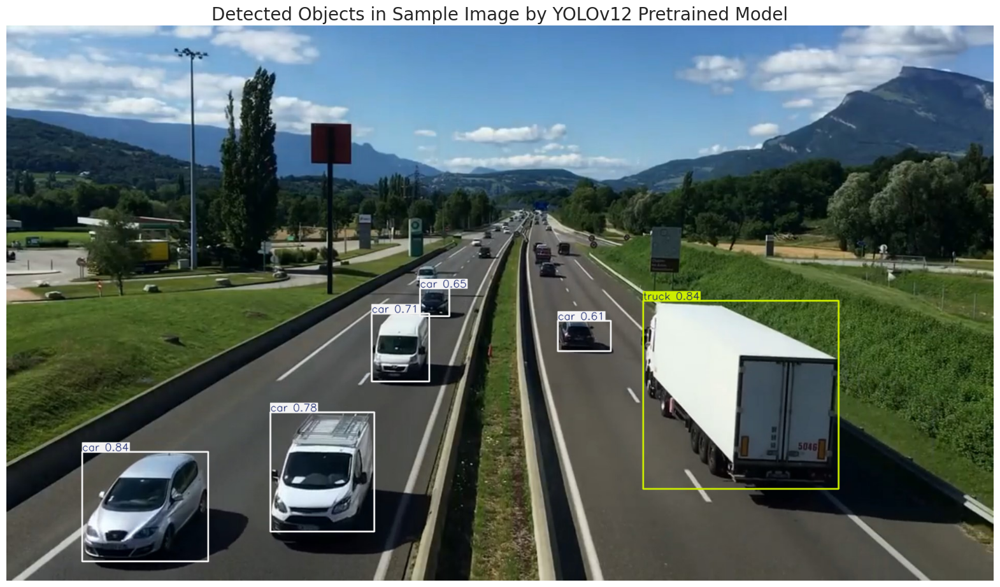

In [10]:
# Path to a sample image
image_path = '/kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/sample_image.jpg'

# Perform inference
results = model_v12.predict(source=image_path, imgsz=640, conf=0.5)

# Annotate image
sample_image = results[0].plot(line_width=2)
sample_image = cv2.cvtColor(sample_image, cv2.COLOR_BGR2RGB)

# Display result
plt.figure(figsize=(20,15))
plt.imshow(sample_image)
plt.title("Detected Objects in Sample Image by YOLOv12 Pretrained Model", fontsize=20)
plt.axis("off")
plt.show()

# Prepare Dataset

In [13]:
dataset_path = '/kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset'

# Set the path to the YAML file
yaml_file_path = os.path.join(dataset_path, 'data.yaml')

# Load and print the contents of the YAML file
with open(yaml_file_path, 'r') as file:
    yaml_content = yaml.load(file, Loader=yaml.FullLoader)
    print(yaml.dump(yaml_content, default_flow_style=False))

names:
- Vehicle
nc: 1
roboflow:
  license: CC BY 4.0
  project: vehicle_detection_yolov8
  url: https://universe.roboflow.com/farzad/vehicle_detection_yolov8/dataset/3
  version: 3
  workspace: farzad
train: ../train/images
val: ../valid/images



Number of training images: 536
Number of validation images: 90
Training image sizes: {(640, 640)}
Validation image sizes: {(640, 640)}


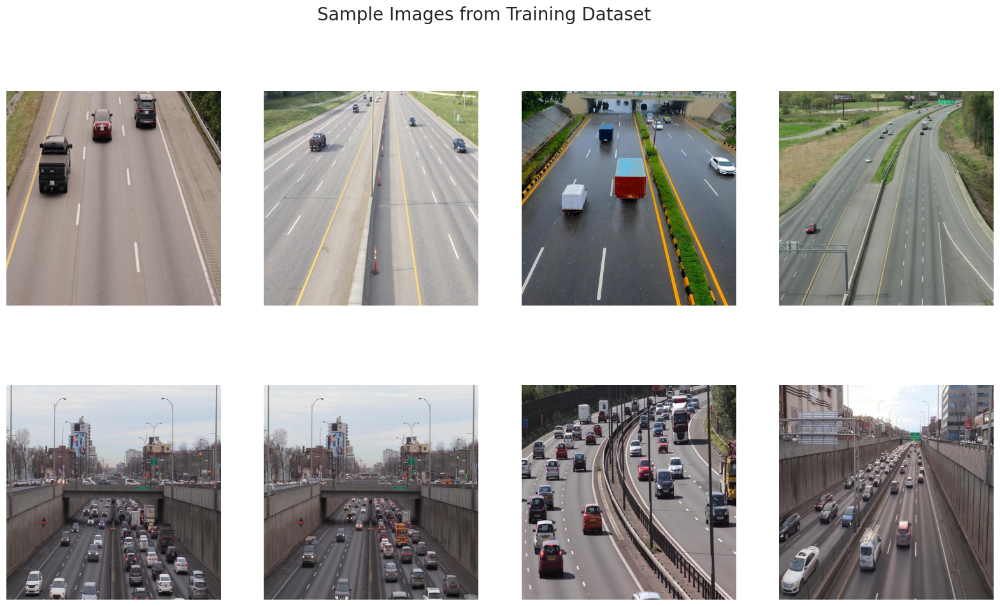

In [14]:
train_images_path = os.path.join(dataset_path, 'train', 'images')
valid_images_path = os.path.join(dataset_path, 'valid', 'images')

num_train_images, num_valid_images = 0, 0
train_image_sizes, valid_image_sizes = set(), set()

# Training set check
for filename in os.listdir(train_images_path):
    if filename.endswith('.jpg'):
        num_train_images += 1
        with Image.open(os.path.join(train_images_path, filename)) as img:
            train_image_sizes.add(img.size)

# Validation set check
for filename in os.listdir(valid_images_path):
    if filename.endswith('.jpg'):
        num_valid_images += 1
        with Image.open(os.path.join(valid_images_path, filename)) as img:
            valid_image_sizes.add(img.size)

print(f"Number of training images: {num_train_images}")
print(f"Number of validation images: {num_valid_images}")
print("Training image sizes:", train_image_sizes)
print("Validation image sizes:", valid_image_sizes)

# Show sample images
image_files = [f for f in os.listdir(train_images_path) if f.endswith('.jpg')]
selected_images = [image_files[i] for i in range(0, len(image_files), len(image_files)//8)]

fig, axes = plt.subplots(2, 4, figsize=(20, 11))
for ax, img_file in zip(axes.ravel(), selected_images):
    image = Image.open(os.path.join(train_images_path, img_file))
    ax.imshow(image)
    ax.axis("off")
plt.suptitle("Sample Images from Training Dataset", fontsize=20)
plt.show()


In [9]:

results = model_v12.train(
    data=yaml_file_path,
    epochs=100,
    imgsz=640,
    device=0,
    patience=50,
    batch=32,
    optimizer='auto',
    lr0=0.0001,
    lrf=0.1,
    dropout=0.1,
    seed=0
)

Ultralytics 8.3.202 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=32, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.1, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.0001, lrf=0.1, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo12n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, o

args.yaml			 labels.jpg	      train_batch1.jpg
BoxF1_curve.png			 results.csv	      train_batch2.jpg
BoxP_curve.png			 results.png	      val_batch0_labels.jpg
BoxPR_curve.png			 train_batch0.jpg     val_batch0_pred.jpg
BoxR_curve.png			 train_batch1530.jpg  val_batch1_labels.jpg
confusion_matrix_normalized.png  train_batch1531.jpg  val_batch1_pred.jpg
confusion_matrix.png		 train_batch1532.jpg  weights


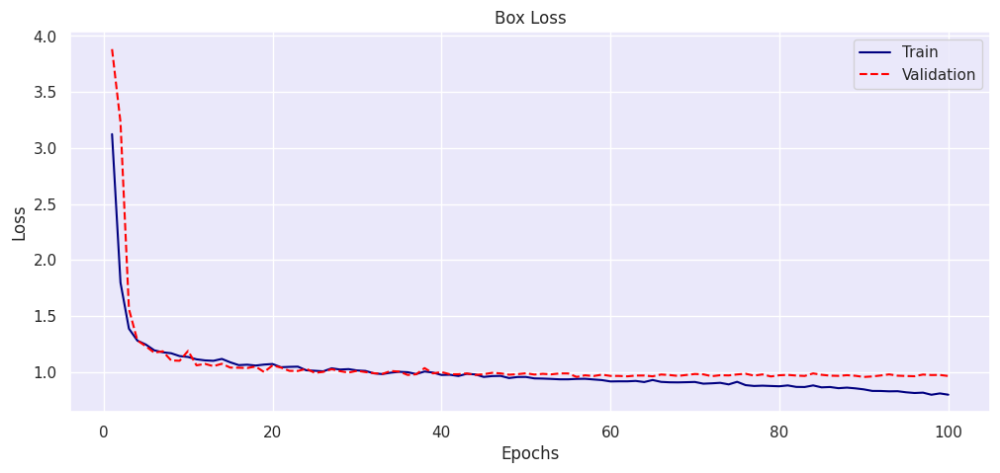

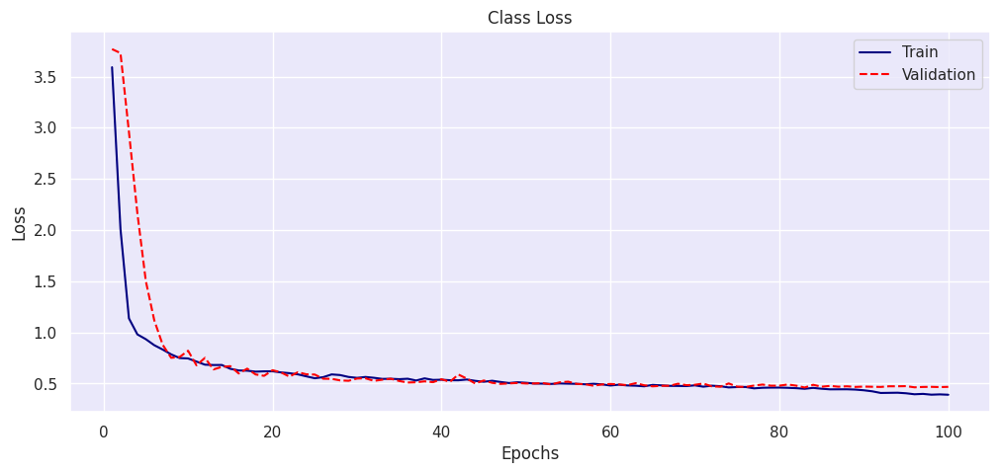

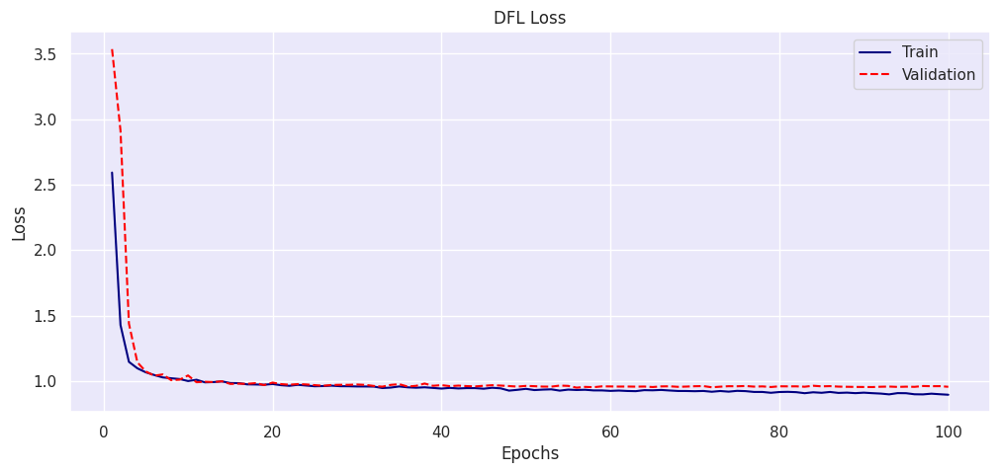

In [10]:

post_training_files_path = '/kaggle/working/runs/detect/train'
!ls {post_training_files_path}

def plot_learning_curve(df, train_loss_col, val_loss_col, title):
    plt.figure(figsize=(12,5))
    sns.lineplot(data=df, x='epoch', y=train_loss_col, label='Train', color='navy')
    sns.lineplot(data=df, x='epoch', y=val_loss_col, label='Validation', color='red', linestyle='--')
    plt.title(title)
    plt.xlabel("Epochs")
    plt.ylabel("Loss")
    plt.legend()
    plt.show()

results_csv_path = os.path.join(post_training_files_path, 'results.csv')
df = pd.read_csv(results_csv_path)
df.columns = df.columns.str.strip()

plot_learning_curve(df, 'train/box_loss', 'val/box_loss', 'Box Loss')
plot_learning_curve(df, 'train/cls_loss', 'val/cls_loss', 'Class Loss')
plot_learning_curve(df, 'train/dfl_loss', 'val/dfl_loss', 'DFL Loss')


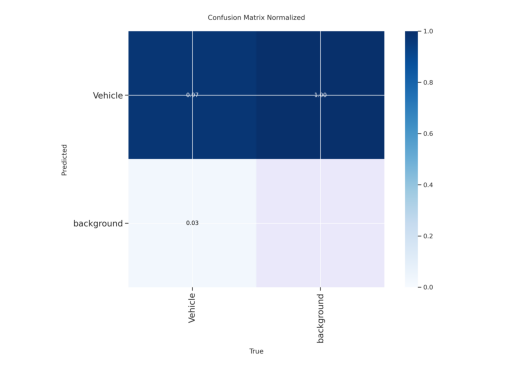

Ultralytics 8.3.202 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15095MiB)
YOLOv12n summary (fused): 159 layers, 2,556,923 parameters, 0 gradients, 6.3 GFLOPs
val: Fast image access ✅ (ping: 0.5±0.2 ms, read: 148.2±30.4 MB/s, size: 61.7 KB)
val: Scanning /kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/valid/labels... 90 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 90/90 514.3it/s 0.2s0.3s
WARNING ⚠️ val: Cache directory /kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/valid is not writeable, cache not saved.
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 6/6 2.0it/s 3.0s0.3ss
                   all         90        937      0.919      0.928      0.968      0.731
Speed: 3.7ms preprocess, 10.7ms inference, 0.0ms loss, 5.9ms postprocess per image
Results saved to /kaggle/working/runs/detect/val


,Metric Value
metrics/precision(B),0.919
metrics/recall(B),0.928
metrics/mAP50(B),0.968
metrics/mAP50-95(B),0.731
fitness,0.731


In [11]:
# Confusion Matrix
cm_img = cv2.imread(os.path.join(post_training_files_path, 'confusion_matrix_normalized.png'))
cm_img = cv2.cvtColor(cm_img, cv2.COLOR_BGR2RGB)
plt.imshow(cm_img)
plt.axis("off")
plt.show()

# Load best weights
best_model_path = os.path.join(post_training_files_path, 'weights/best.pt')
best_model = YOLO(best_model_path)

# Validate model
metrics = best_model.val(split='val')
pd.DataFrame.from_dict(metrics.results_dict, orient='index', columns=['Metric Value']).round(3)



image 1/1 /kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/valid/images/6_mp4-0_jpg.rf.9a055d040151678e04cb48a8bde76f55.jpg: 640x640 3 Vehicles, 15.0ms
Speed: 1.7ms preprocess, 15.0ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/valid/images/4_mp4-7_jpg.rf.439bc6176789cd7ca6bd686e23fc5ddf.jpg: 640x640 16 Vehicles, 14.7ms
Speed: 1.4ms preprocess, 14.7ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/valid/images/6_mp4-14_jpg.rf.a5099c3eeb2c707a2193c0efa467bb2a.jpg: 640x640 3 Vehicles, 13.7ms
Speed: 1.4ms preprocess, 13.7ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/valid/images/11_mp4-15_jpg.rf.b1bdb8

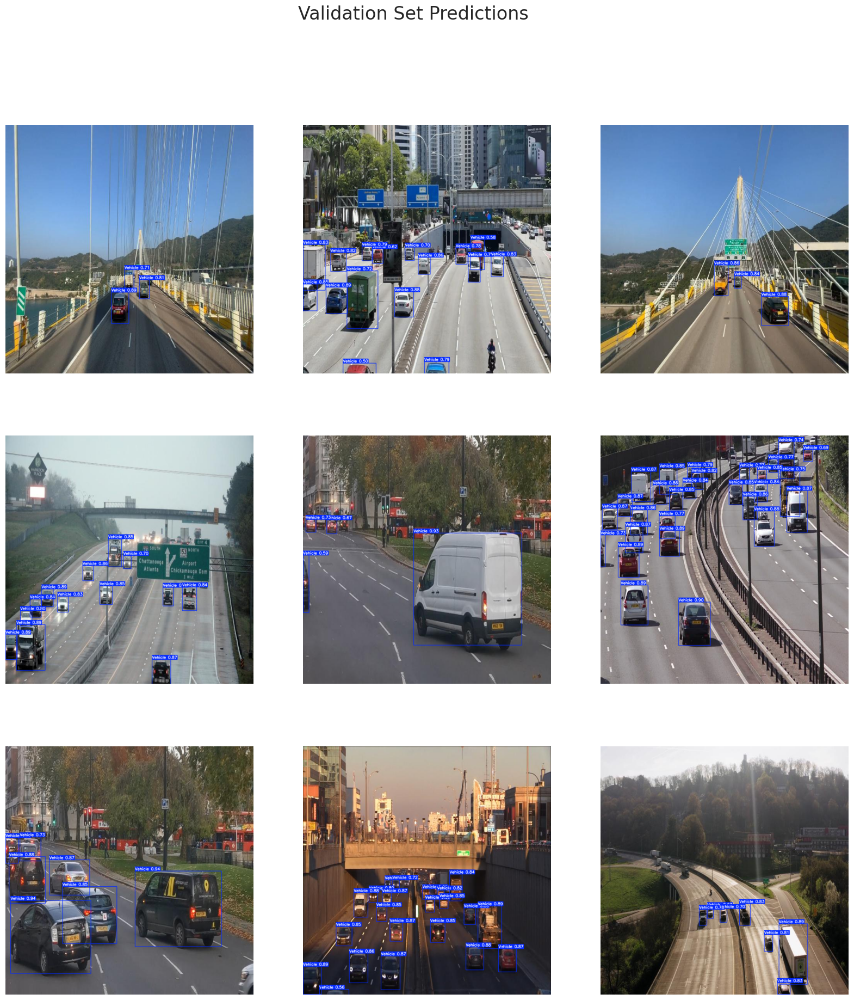

In [12]:
valid_images_path = os.path.join(dataset_path, 'valid', 'images')
image_files = [f for f in os.listdir(valid_images_path) if f.endswith('.jpg')]
selected_images = [image_files[i] for i in range(0, len(image_files), len(image_files)//9)]

fig, axes = plt.subplots(3, 3, figsize=(20,21))
for i, ax in enumerate(axes.flatten()):
    results = best_model.predict(source=os.path.join(valid_images_path, selected_images[i]), imgsz=640, conf=0.5)
    annotated = cv2.cvtColor(results[0].plot(line_width=1), cv2.COLOR_BGR2RGB)
    ax.imshow(annotated)
    ax.axis("off")
plt.suptitle("Validation Set Predictions", fontsize=24)
plt.show()


image 1/1 /kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/sample_image.jpg: 384x640 6 Vehicles, 20.6ms
Speed: 2.4ms preprocess, 20.6ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)


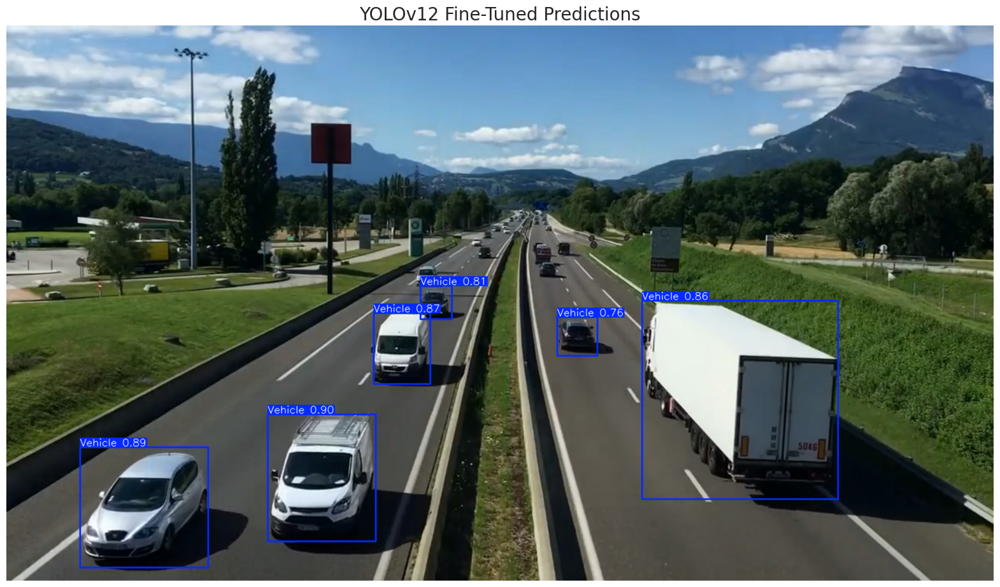

In [13]:
# Sample image inference
sample_image_path = '/kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/sample_image.jpg'
results = best_model.predict(source=sample_image_path, imgsz=640, conf=0.7)
annotated = cv2.cvtColor(results[0].plot(line_width=2), cv2.COLOR_BGR2RGB)

plt.figure(figsize=(20,15))
plt.imshow(annotated)
plt.title("YOLOv12 Fine-Tuned Predictions", fontsize=20)
plt.axis("off")
plt.show()


In [14]:
# Video inference
dataset_video_path = '/kaggle/input/top-view-vehicle-detection-image-dataset/Vehicle_Detection_Image_Dataset/sample_video.mp4'
video_path = '/kaggle/working/sample_video.mp4'
shutil.copyfile(dataset_video_path, video_path)

best_model.predict(source=video_path, save=True)


WARNING ⚠️ 
inference results will accumulate in RAM unless `stream=True` is passed, causing potential out-of-memory
errors for large sources or long-running streams and videos. See https://docs.ultralytics.com/modes/predict/ for help.

Example:
    results = model(source=..., stream=True)  # generator of Results objects
    for r in results:
        boxes = r.boxes  # Boxes object for bbox outputs
        masks = r.masks  # Masks object for segment masks outputs
        probs = r.probs  # Class probabilities for classification outputs

video 1/1 (frame 1/601) /kaggle/working/sample_video.mp4: 384x640 3 Vehicles, 14.9ms
video 1/1 (frame 2/601) /kaggle/working/sample_video.mp4: 384x640 3 Vehicles, 14.1ms
video 1/1 (frame 3/601) /kaggle/working/sample_video.mp4: 384x640 3 Vehicles, 13.6ms
video 1/1 (frame 4/601) /kaggle/working/sample_video.mp4: 384x640 3 Vehicles, 13.6ms
video 1/1 (frame 5/601) /kaggle/working/sample_video.mp4: 384x640 3 Vehicles, 14.0ms
video 1/1 (frame 6/601) /kaggle

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'Vehicle'}
 obb: None
 orig_img: array([[[252, 245, 242],
         [252, 245, 242],
         [252, 245, 242],
         ...,
         [210, 184, 166],
         [210, 184, 166],
         [210, 184, 166]],
 
        [[252, 245, 242],
         [252, 245, 242],
         [252, 245, 242],
         ...,
         [210, 184, 166],
         [210, 184, 166],
         [210, 184, 166]],
 
        [[254, 246, 241],
         [254, 246, 241],
         [254, 246, 241],
         ...,
         [210, 184, 166],
         [210, 184, 166],
         [210, 184, 166]],
 
        ...,
 
        [[ 94, 104, 103],
         [ 96, 106, 105],
         [101, 111, 110],
         ...,
         [ 94, 106, 111],
         [ 95, 107, 112],
         [ 97, 109, 114]],
 
        [[ 98, 108, 107],
         [103, 113, 112],
         [100, 110, 109],
         ...,
         [ 95, 10

In [15]:
from IPython.display import Video
import os

# Path to YOLOv12 prediction output (latest run)
output_dir = "/kaggle/working/runs/detect/predict"
pred_video_path = os.path.join(output_dir, "sample_video.mp4")

# If YOLO saved in .avi, convert to .mp4
if not os.path.exists(pred_video_path):
    avi_path = os.path.join(output_dir, "sample_video.avi")
    if os.path.exists(avi_path):
        !ffmpeg -y -loglevel panic -i {avi_path} processed_sample_video.mp4
        pred_video_path = "processed_sample_video.mp4"

# Display video in notebook
Video(pred_video_path, embed=True, width=960)
